# Comparing different ap_pipe runs:
# HiTS 2014 and 2015, DCR and CompareWarp

Earlier work in DM-18416 predicted that the 2015 HiTS dataset might make better DCR templates for image differencing than the 2014 dataset, since it had a broader range of airmasses and the seeing was better. Due to a recent decision to change the template image resolution to 0.26", the data from both years of the survey were completely reprocessed. This also ensures that the code and configuration settings used in each case is exactly the same.
For these tests, separate coadds were made using the 2014 and 2015 datasets, and both CompareWarp and DCR coadds were made for each year. The 2014 coadds were used as templates for image differencing using the 2015 science images, and the 2015 coadds were used for the 2014 science images.

## Set up the environment and import packages

In [1]:
%matplotlib notebook
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sqlite3
import functools
import itertools
import importlib
import operator

import astropy
from astropy.visualization import ZScaleInterval, SqrtStretch, ImageNormalize
import astropy.units as u
import astropy.coordinates as coord

import lsst.geom
import lsst.daf.persistence as dafPersist
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')
from lsst.ap.association import UnpackApdbFlags, MapDiaSourceConfig
from lsst.utils import getPackageDir

In [2]:
sys.path.append('/project/sullivan/ap_pipe-notebooks/')
from diaObjectAnalysis import loadAllApdbObjects, loadAllApdbSources, plotDiaObjectsOnSky #, setObjectFilter
import plotLightcurve as plc  # in_ipynb, loadPpdbObjects, loadPpdbSources, patchFinder, plotLightcurve

In [3]:
# Only if you change anything in the code imported above
importlib.reload(plc)

<module 'plotLightcurve' from '/home/sullivan/ap_pipe-notebooks/plotLightcurve.py'>

In [88]:
from dcrMetric import DcrMetric

## Perform a few sanity checks on the coadds used for templates

In [5]:
dcr2014_repo = '/project/sullivan/jan_2020/hits2014/assemble_dcr/'
butlerDcr2014 = dafPersist.Butler(dcr2014_repo)
dcr2015_repo = '/project/sullivan/jan_2020/hits2015/assemble_dcr/'
butlerDcr2015 = dafPersist.Butler(dcr2015_repo)

In [6]:
cw2014_repo = '/project/sullivan/jan_2020/hits2014/assemble_cw'
butlerCw2014 = dafPersist.Butler(cw2014_repo)
cw2015_repo = '/project/sullivan/jan_2020/hits2015/assemble_cw'
butlerCw2015 = dafPersist.Butler(cw2015_repo)

In [7]:
patch = '32,37'
coadd_cw2014 = butlerCw2014.get('deepCoadd', dataId={'tract':0,'patch':patch,'filter':'g'})
coadd_cw2015 = butlerCw2015.get('deepCoadd', dataId={'tract':0,'patch':patch,'filter':'g'})

In [8]:
coadd_dcr2014 = butlerDcr2014.get('dcrCoadd', dataId={'tract':0,'patch':patch,'filter':'g', 'subfilter':1, 'numSubfilters':3})
coadd_dcr2015 = butlerDcr2015.get('dcrCoadd', dataId={'tract':0,'patch':patch,'filter':'g', 'subfilter':1, 'numSubfilters':3})

In [9]:
print(butlerCw2014.getUri('deepCoadd', dataId={'tract':0,'patch':patch,'filter':'g'}))
print(butlerCw2015.getUri('deepCoadd', dataId={'tract':0,'patch':patch,'filter':'g'}))

/project/sullivan/jan_2020/hits2014/assemble_cw/deepCoadd/g/0/32,37.fits
/project/sullivan/jan_2020/hits2015/assemble_cw/deepCoadd/g/0/32,37.fits


Visually verify that the coadds are OK, and check that they have appropriate visit IDs. This check is important because an error in the setup can easily lead to the wrong coadds being loaded for the template (from the parent repository). 2014 visit IDs should start with a '2' and 2015 visit IDs should start with a '4'.

In [10]:
a = coadd_cw2014.getInfo().getCoaddInputs().ccds.asAstropy()["visit"]
b = coadd_cw2015.getInfo().getCoaddInputs().ccds.asAstropy()["visit"]

In [11]:
print(min(a),max(a), min(b), max(b))

288929 292404 410915 421590


<IPython.core.display.Javascript object>


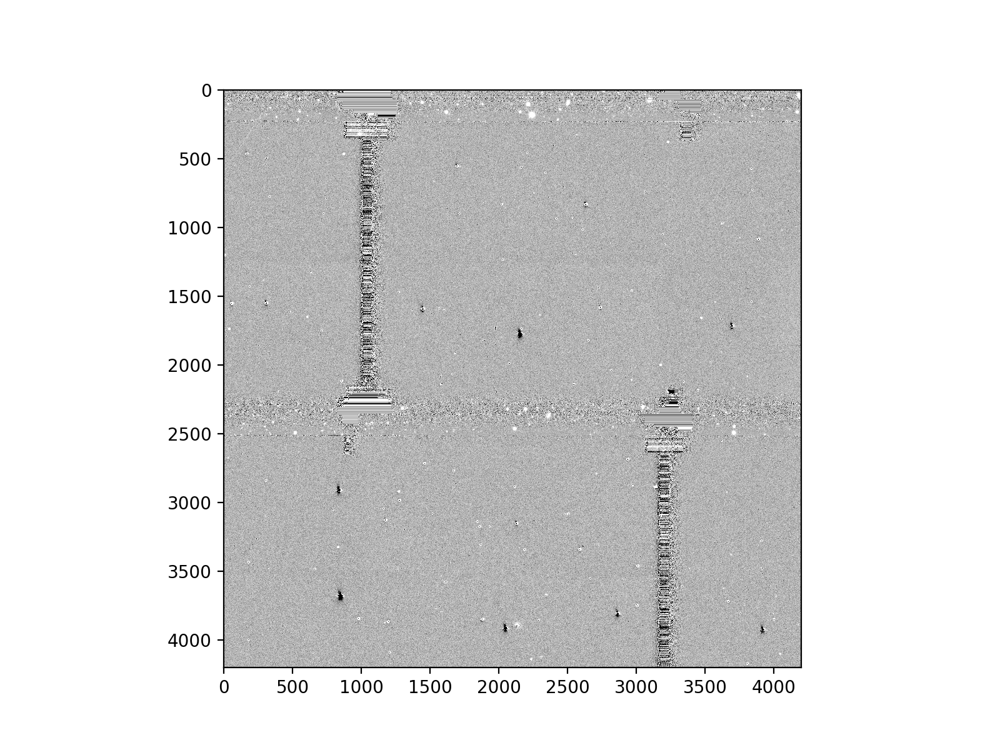

<IPython.core.display.Javascript object>


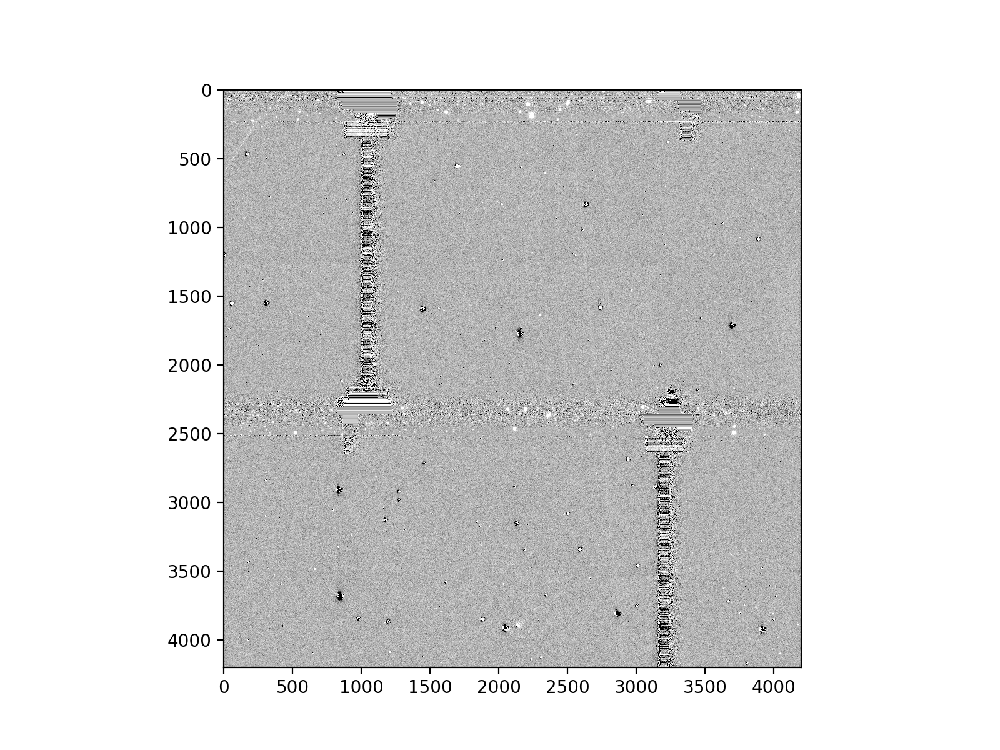

In [12]:
from astropy.visualization import (ZScaleInterval, SqrtStretch, ImageNormalize)
plt.figure(figsize=(8, 6))
img1a = coadd_cw2014.getImage().getArray()
img2a = coadd_cw2015.getImage().getArray()
norm = ImageNormalize(img1a, interval=ZScaleInterval(), stretch=SqrtStretch())
plt.imshow(img1a - img2a, norm=norm, cmap='gray')
plt.figure(figsize=(8, 6))
# Note: multiply the DCR images by 3, because each is just the middle subfilter out of 3 and contains 1/3 the flux.
img1b = coadd_dcr2014.getImage().getArray()*3
img2b = coadd_dcr2015.getImage().getArray()*3
plt.imshow(img1b - img2b, norm=norm, cmap='gray')

Looks fine, but the DCR coadd appears to contain a couple satellite trails (probably?) that were properly masked in the comparewarp coadd. This is a bug, see ticket DM-22825.

# Load the ap_pipe runs

In [13]:
dbName = 'association.db'
rerunNameCw = 'cw'
rerunNameDcr = 'dcr'
rerunNameCw2 = 'cw_goodSeeing'
rerunNameDcr2 = 'dcr_goodSeeing'
rerunNameDcr3 = 'dcr_goodSeeing2'
rerunNameCw2self = 'cw_self_goodSeeing'
rerunNameDcr2self = 'dcr_self_goodSeeing'

Set up the butlers for each run

In [14]:
# CompareWarp rerun, 2014 template and 2015 science.
# Uses 0.26" pixels for the template, same as the rest of the runs
# Includes ALL 2014 data, with no selection based on seeing
repoCw15 = '/project/sullivan/jan_2020/hits2015/ap_pipe/' + rerunNameCw
butlerCw15 = dafPersist.Butler(repoCw15)
dbPathCw15 = os.path.join(repoCw15, dbName)

In [15]:
# CompareWarp rerun, 2014 template and 2015 science
# The 2014 template used a maximum seeing of 1.67"
repoCw15b = '/project/sullivan/jan_2020/hits2015/ap_pipe/' + rerunNameCw2
butlerCw15b = dafPersist.Butler(repoCw15b)
dbPathCw15b = os.path.join(repoCw15b, dbName)

In [16]:
# CompareWarp rerun, 2015 template and 2014 science
# Includes ALL 2015 data with no selection based on seeing
repoCw14 = '/project/sullivan/jan_2020/hits2014/ap_pipe/' + rerunNameCw
butlerCw14 = dafPersist.Butler(repoCw14)
dbPathCw14 = os.path.join(repoCw14, dbName)

In [17]:
# CompareWarp rerun, 2015 template and 2014 science
# The 2015 template used a maximum seeing of 1.41"
repoCw14b = '/project/sullivan/jan_2020/hits2014/ap_pipe/' + rerunNameCw2
butlerCw14b = dafPersist.Butler(repoCw14b)
dbPathCw14b = os.path.join(repoCw14b, dbName)

In [18]:
# DCR rerun, 2014 template and 2015 science
# Includes ALL 2014 data with no selection based on seeing
repoDcr15 = '/project/sullivan/jan_2020/hits2015/ap_pipe/' + rerunNameDcr
butlerDcr15 = dafPersist.Butler(repoDcr15)
dbPathDcr15 = os.path.join(repoDcr15, dbName)

In [19]:
# DCR rerun, 2014 template and 2015 science
# The 2014 DCR model used a maximum seeing of 1.67"
repoDcr15b = '/project/sullivan/jan_2020/hits2015/ap_pipe/' + rerunNameDcr2
butlerDcr15b = dafPersist.Butler(repoDcr15b)
dbPathDcr15b = os.path.join(repoDcr15b, dbName)

In [20]:
# DCR rerun, 2015 template and 2014 science
# Includes ALL 2015 data, with no selection based on seeing
repoDcr14 = '/project/sullivan/jan_2020/hits2014/ap_pipe/' + rerunNameDcr
butlerDcr14 = dafPersist.Butler(repoDcr14)
dbPathDcr14 = os.path.join(repoDcr14, dbName)

In [21]:
# DCR rerun, 2015 template and 2014 science
# The 2015 DCR model used a maximum seeing of 1.41"
repoDcr14b = '/project/sullivan/jan_2020/hits2014/ap_pipe/' + rerunNameDcr2
butlerDcr14b = dafPersist.Butler(repoDcr14b)
dbPathDcr14b = os.path.join(repoDcr14b, dbName)

In [22]:
# DCR rerun, 2014 template and 2015 science
# The 2014 DCR model used a maximum seeing of 1.41"
repoDcr15c = '/project/sullivan/jan_2020/hits2015/ap_pipe/' + rerunNameDcr3
butlerDcr15c = dafPersist.Butler(repoDcr15c)
dbPathDcr15c = os.path.join(repoDcr15c, dbName)

Also include a test where the same dataset used to build the template is used for the science images for ap_pipe.

In [23]:
# DCR rerun, 2015 template and ALSO 2015 science
# The 2015 DCR model used a maximum seeing of 1.41"
repoDcr15_self = '/project/sullivan/jan_2020/hits2015/ap_pipe/' + rerunNameDcr2self
butlerDcr15_self = dafPersist.Butler(repoDcr15_self)
dbPathDcr15_self = os.path.join(repoDcr15_self, dbName)

In [24]:
# CompareWarp rerun, 2015 template and ALSO 2015 science
# The 2015 template used a maximum seeing of 1.41"
repoCw15_self = '/project/sullivan/jan_2020/hits2015/ap_pipe/' + rerunNameCw2self
butlerCw15_self = dafPersist.Butler(repoCw15_self)
dbPathCw15_self = os.path.join(repoCw15_self, dbName)

Load the difference imaging sources and objects from the Alert Production Database (APDB)

In [25]:
objTableCw14 = loadAllApdbObjects(repoCw14, dbName)
objTableCw15 = loadAllApdbObjects(repoCw15, dbName)
objTableDcr14 = loadAllApdbObjects(repoDcr14, dbName)
objTableDcr15 = loadAllApdbObjects(repoDcr15, dbName)

In [26]:
objTableCw14b = loadAllApdbObjects(repoCw14b, dbName)
objTableCw15b = loadAllApdbObjects(repoCw15b, dbName)
objTableDcr14b = loadAllApdbObjects(repoDcr14b, dbName)
objTableDcr15b = loadAllApdbObjects(repoDcr15b, dbName)

In [27]:
srcTableCw14 = loadAllApdbSources(repoCw14, dbName)
srcTableCw15 = loadAllApdbSources(repoCw15, dbName)
srcTableDcr14 = loadAllApdbSources(repoDcr14, dbName)
srcTableDcr15 = loadAllApdbSources(repoDcr15, dbName)

In [28]:
srcTableCw14b = loadAllApdbSources(repoCw14b, dbName)
srcTableCw15b = loadAllApdbSources(repoCw15b, dbName)
srcTableDcr14b = loadAllApdbSources(repoDcr14b, dbName)
srcTableDcr15b = loadAllApdbSources(repoDcr15b, dbName)

In [29]:
objTableDcr15c = loadAllApdbObjects(repoDcr15c, dbName)
objTableCw15_self = loadAllApdbObjects(repoCw15_self, dbName)
objTableDcr15_self = loadAllApdbObjects(repoDcr15_self, dbName)

In [30]:
srcTableDcr15c = loadAllApdbSources(repoDcr15c, dbName)
srcTableCw15_self = loadAllApdbSources(repoCw15_self, dbName)
srcTableDcr15_self = loadAllApdbSources(repoDcr15_self, dbName)

Plot the number of DIA objects using the 2014 coadds. Note that there are 21 observations, but there is a small region of overlap between two pointings so we get a small number of objects detected more than 21 times.

<IPython.core.display.Javascript object>


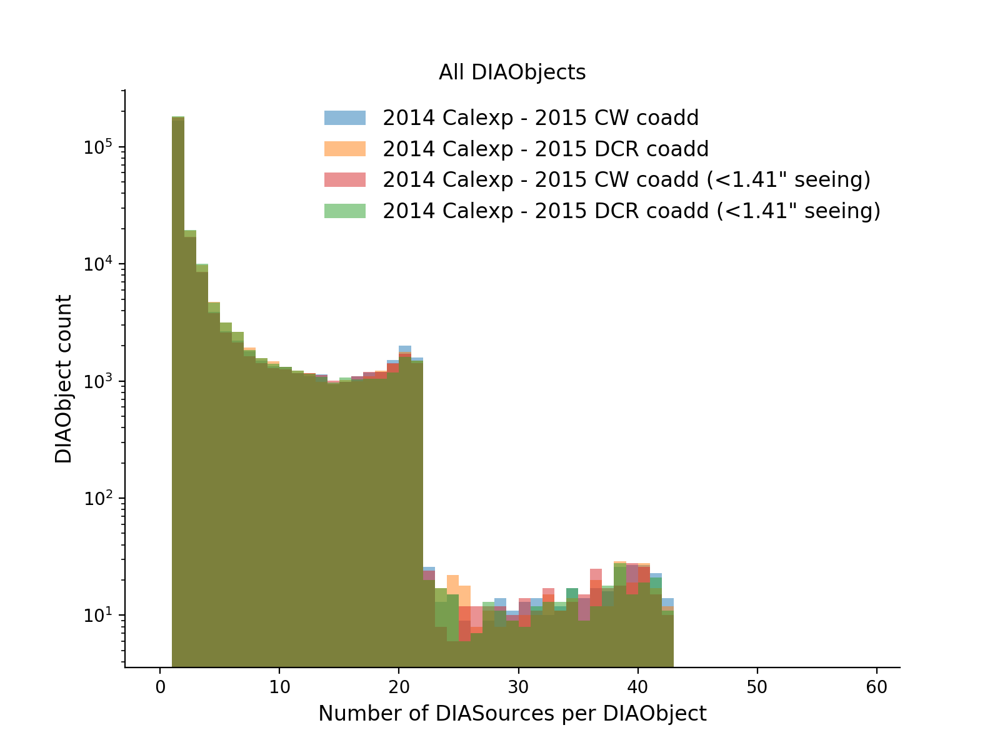

Text(0.5, 1.0, 'All DIAObjects')

In [31]:
plt.figure(figsize=(8, 6))
plt.xlabel('Number of DIASources per DIAObject', size=12)
plt.ylabel('DIAObject count', size=12)
#plt.ylim(0.7, 1e5)
plt.yscale('log')

plt.hist(objTableCw14['nDiaSources'].values, bins=np.arange(0, 60), color='C0', alpha=0.5, label='2014 Calexp - 2015 CW coadd')
plt.hist(objTableDcr14['nDiaSources'].values, bins=np.arange(0, 60), color='C1', alpha=0.5, label='2014 Calexp - 2015 DCR coadd')

plt.hist(objTableCw14b['nDiaSources'].values, bins=np.arange(0, 60), color='C3', alpha=0.5, label='2014 Calexp - 2015 CW coadd (<1.41" seeing)')
plt.hist(objTableDcr14b['nDiaSources'].values, bins=np.arange(0, 60), color='C2', alpha=0.5, label='2014 Calexp - 2015 DCR coadd (<1.41" seeing)')

plt.legend(frameon=False, fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title('All DIAObjects')

Plot the number of DIA objects using the 2015 coadds. Note that there were 28 observations in 2015, and there was the same narrow region of overlap between two fields.

<IPython.core.display.Javascript object>


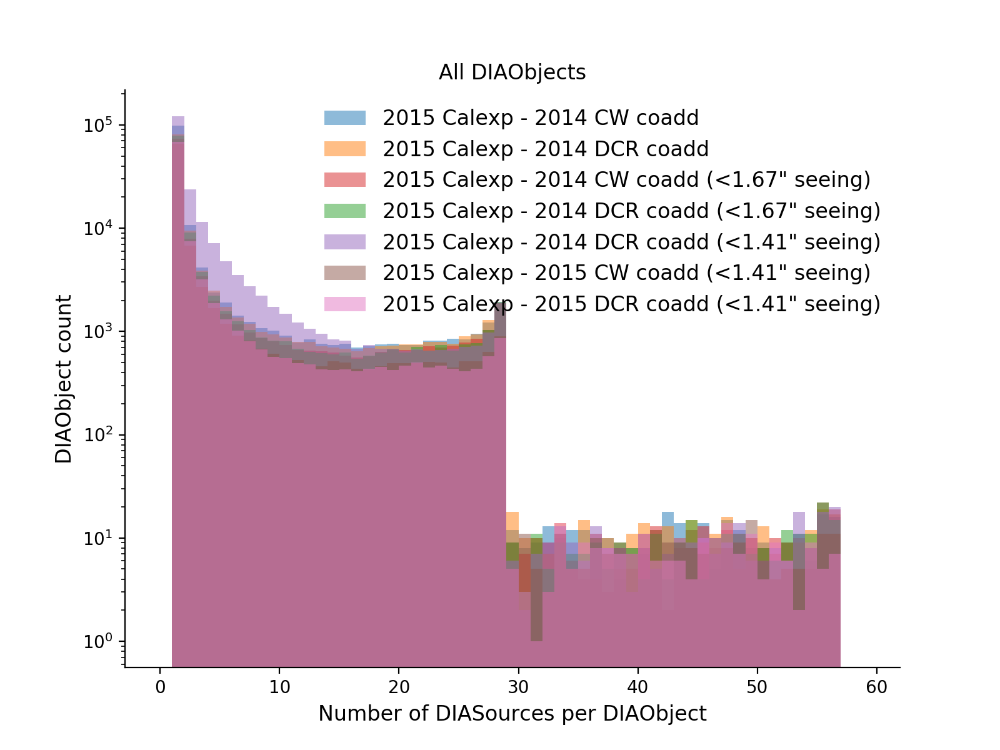

Text(0.5, 1.0, 'All DIAObjects')

In [32]:
plt.figure(figsize=(8, 6))
plt.xlabel('Number of DIASources per DIAObject', size=12)
plt.ylabel('DIAObject count', size=12)
#plt.ylim(0.7, 1e5)
plt.yscale('log')
plt.hist(objTableCw15['nDiaSources'].values, bins=np.arange(0, 60), color='C0', alpha=0.5, label='2015 Calexp - 2014 CW coadd')
plt.hist(objTableDcr15['nDiaSources'].values, bins=np.arange(0, 60), color='C1', alpha=0.5, label='2015 Calexp - 2014 DCR coadd')

plt.hist(objTableCw15b['nDiaSources'].values, bins=np.arange(0, 60), color='C3', alpha=0.5, label='2015 Calexp - 2014 CW coadd (<1.67" seeing)')
plt.hist(objTableDcr15b['nDiaSources'].values, bins=np.arange(0, 60), color='C2', alpha=0.5, label='2015 Calexp - 2014 DCR coadd (<1.67" seeing)')

plt.hist(objTableDcr15c['nDiaSources'].values, bins=np.arange(0, 60), color='C4', alpha=0.5, label='2015 Calexp - 2014 DCR coadd (<1.41" seeing)')

plt.hist(objTableCw15_self['nDiaSources'].values, bins=np.arange(0, 60), color='C5', alpha=0.5, label='2015 Calexp - 2015 CW coadd (<1.41" seeing)')
plt.hist(objTableDcr15_self['nDiaSources'].values, bins=np.arange(0, 60), color='C6', alpha=0.5, label='2015 Calexp - 2015 DCR coadd (<1.41" seeing)')

plt.legend(frameon=False, fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title('All DIAObjects')

The good seeing selection makes a visible difference in the number of difference image analysis (DIA) objects detected, but the CompareWarp and DCR templates are virtually indistinguishable

### Filter out the sources that are flagged

In [33]:
badFlagList = ['base_PixelFlags_flag_bad',
               'base_PixelFlags_flag_suspect',
               'base_PixelFlags_flag_saturatedCenter']

In [34]:
def makeSrcTableFlags(srcTbl, objTbl, badFlagList=badFlagList):
    config = MapDiaSourceConfig()
    unpacker = UnpackApdbFlags(config.flagMap, 'DiaSource')
    flagValues = unpacker.unpack(srcTbl['flags'], 'flags')
    flagTable = pd.DataFrame(flagValues, index=srcTbl.index)
    srcTableFlags = pd.merge(srcTbl, flagTable, left_index=True, right_index=True)
    badFlags = [srcTableFlags[flag] for flag in badFlagList]
    flagFilter = functools.reduce(operator.or_, badFlags)
    noFlagFilter = ~flagFilter
    goodSrc = srcTableFlags.loc[noFlagFilter]
    goodObjIds = set(srcTableFlags.loc[noFlagFilter, 'diaObjectId'])
    goodObj = objTbl.loc[objTbl['diaObjectId'].isin(goodObjIds)]
    return flagTable, flagValues, srcTableFlags, flagFilter, noFlagFilter, goodSrc, goodObj

In [35]:
def loadTables(repo, dbName='association.db'):
    butler = dafPersist.Butler(repo)
    dbPath = os.path.join(repo, dbName)
    objTable = loadAllApdbObjects(repo, dbName)
    srcTable = loadAllApdbSources(repo, dbName)
    flagTable, flagValues, srcTableFlags, flagFilter, noFlagFilter, \
    goodSrc, goodObj = makeSrcTableFlags(srcTable, objTable)
    return objTable, srcTable, goodObj, goodSrc

In [36]:
objTableCw14, srcTableCw14, goodObjCw14, goodSrcCw14 = loadTables(repoCw14)
objTableCw15, srcTableCw15, goodObjCw15, goodSrcCw15 = loadTables(repoCw15)
objTableDcr14, srcTableDcr14, goodObjDcr14, goodSrcDcr14 = loadTables(repoDcr14)
objTableDcr15, srcTableDcr15, goodObjDcr15, goodSrcDcr15 = loadTables(repoDcr15)

/opt/lsst/software/stack/stack/miniconda3-4.7.10-4d7b902/Linux64/ap_association/19.0.0-7-g0448a4c+1/python/lsst/ap/association/mapApData.py:388: YAMLLoadWarning: calling yaml.load_all() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  table_list = list(yaml.load_all(yaml_stream))


In [37]:
objTableCw14b, srcTableCw14b, goodObjCw14b, goodSrcCw14b = loadTables(repoCw14b)
objTableCw15b, srcTableCw15b, goodObjCw15b, goodSrcCw15b = loadTables(repoCw15b)
objTableDcr14b, srcTableDcr14b, goodObjDcr14b, goodSrcDcr14b = loadTables(repoDcr14b)
objTableDcr15b, srcTableDcr15b, goodObjDcr15b, goodSrcDcr15b = loadTables(repoDcr15b)

In [38]:
objTableDcr15c, srcTableDcr15c, goodObjDcr15c, goodSrcDcr15c = loadTables(repoDcr15c)
objTableCw15_self, srcTableCw15_self, goodObjCw15_self, goodSrcCw15_self = loadTables(repoCw15_self)
objTableDcr15_self, srcTableDcr15_self, goodObjDcr15_self, goodSrcDcr15_self = loadTables(repoDcr15_self)

Visualize the good DIA objects in the 2014 science images, using 2015 CW templates

In [39]:
def plotHitsSourcesOnSky(srcTable, title=None):
    fig = plt.figure(figsize=(10, 8))
    ax1 = plt.subplot2grid((100, 100), (0, 55), rowspan=50, colspan=45)  # 1 single HiTS field, on the right
    ax2 = plt.subplot2grid((100, 100), (0, 0), rowspan=90, colspan=50)  # 2 overlapping HiTS fields, on the left
    ax1Filter = (srcTable['decl'] > -2)
    ax2Filter = (~ax1Filter)
    scatter1 = ax1.scatter(srcTable.loc[ax1Filter, 'ra'],
                           srcTable.loc[ax1Filter, 'decl'], 
                           c='C0', s=2, alpha=0.2)
    scatter2 = ax2.scatter(srcTable.loc[ax2Filter, 'ra'], 
                           srcTable.loc[ax2Filter, 'decl'], 
                           c='C0', s=2, alpha=0.2)
    ax1.set_xlabel('RA (deg)')
    ax2.set_xlabel('RA (deg)')
    ax1.set_ylabel('Dec (deg)')
    ax2.set_ylabel('Dec (deg)')
    ax1.spines['top'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax1.invert_xaxis()
    ax2.invert_xaxis()
    ax1.yaxis.tick_right()
    ax1.yaxis.set_label_position('right')
    plt.subplots_adjust(wspace=0.1, hspace=0)
    if title is not None:
        plt.title(title)

### Visualize the good DIA objects in the 2015 science images, using 2014 CW templates

<IPython.core.display.Javascript object>


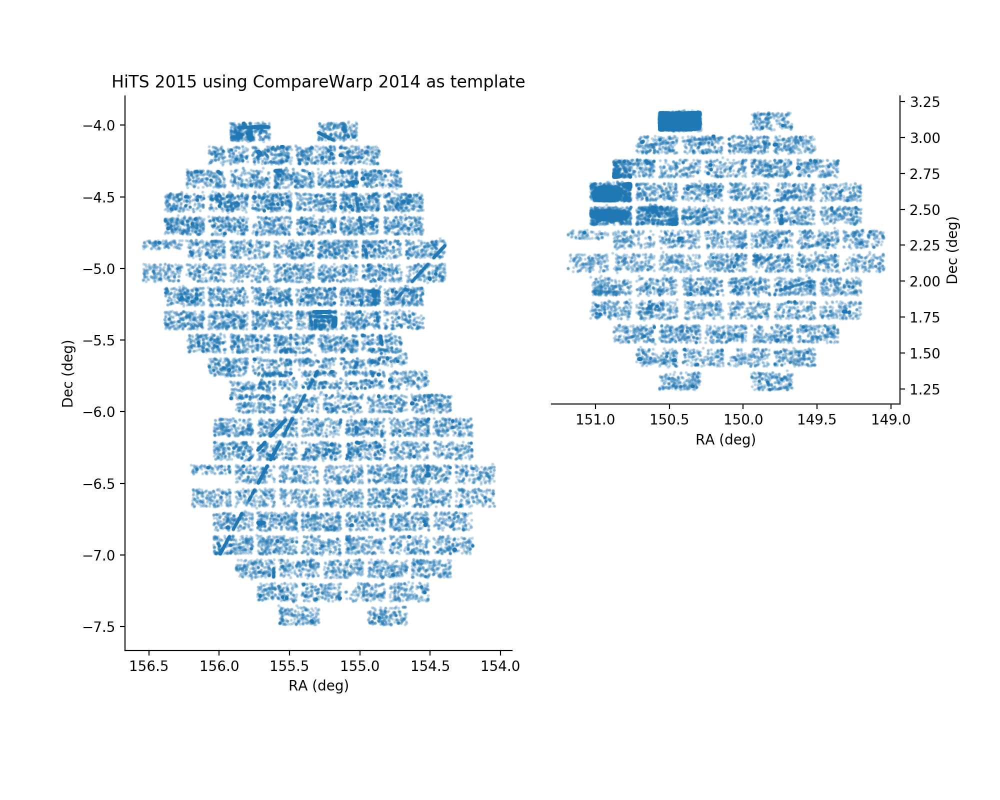

In [40]:
fig1 = plotHitsSourcesOnSky(goodObjCw15, title="HiTS 2015 using CompareWarp 2014 as template")

<IPython.core.display.Javascript object>


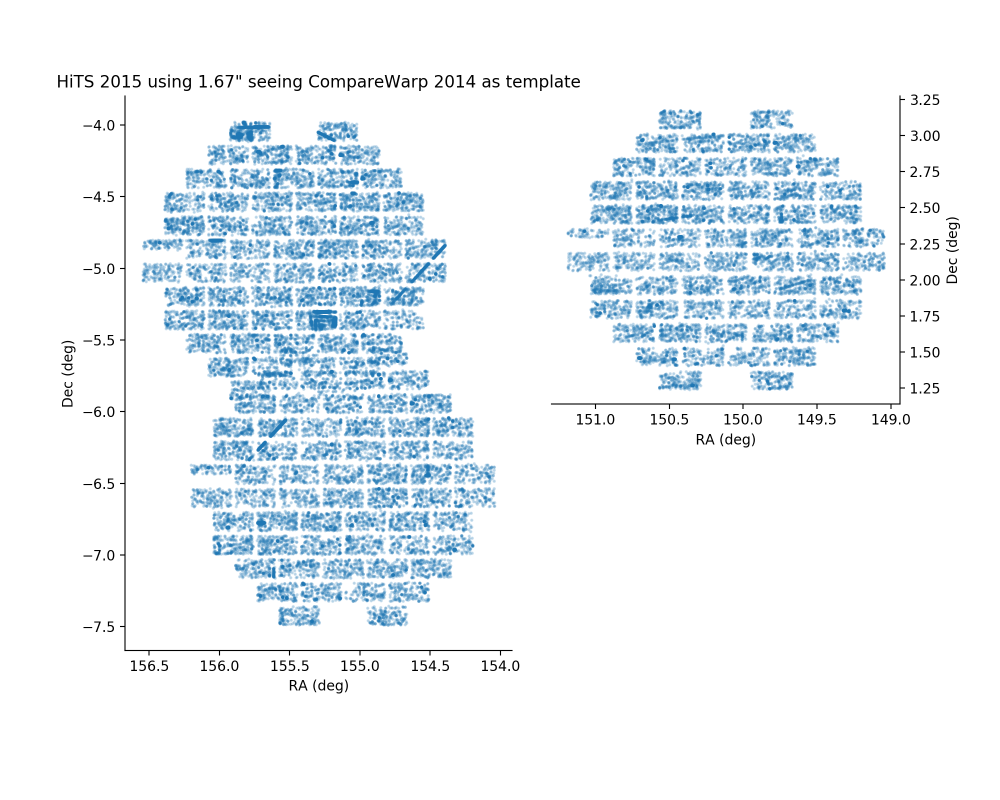

In [41]:
fig1 = plotHitsSourcesOnSky(goodObjCw15b, title="HiTS 2015 using 1.67\" seeing CompareWarp 2014 as template")

### Notice that the handful of CCDs with excess sources are cleaned up by using the good seeing selection

### Visualize the good DIA objects in the 2015 science images, using 2014 DCR templates

<IPython.core.display.Javascript object>


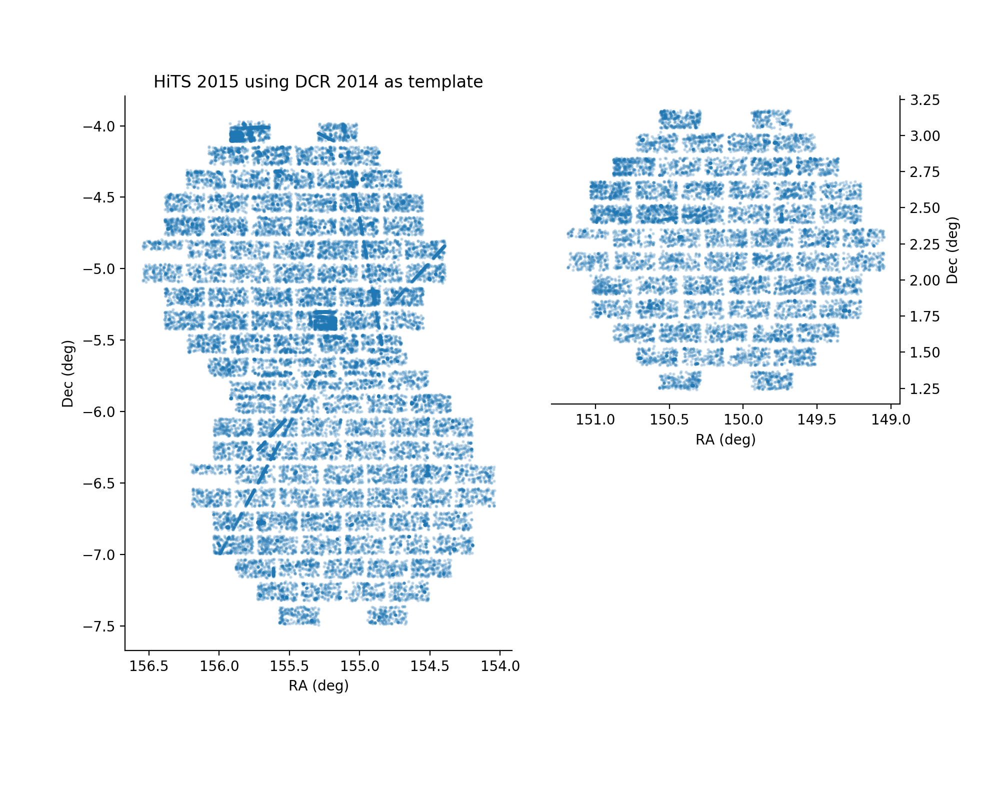

In [42]:
fig1 = plotHitsSourcesOnSky(goodObjDcr15, title="HiTS 2015 using DCR 2014 as template")

<IPython.core.display.Javascript object>


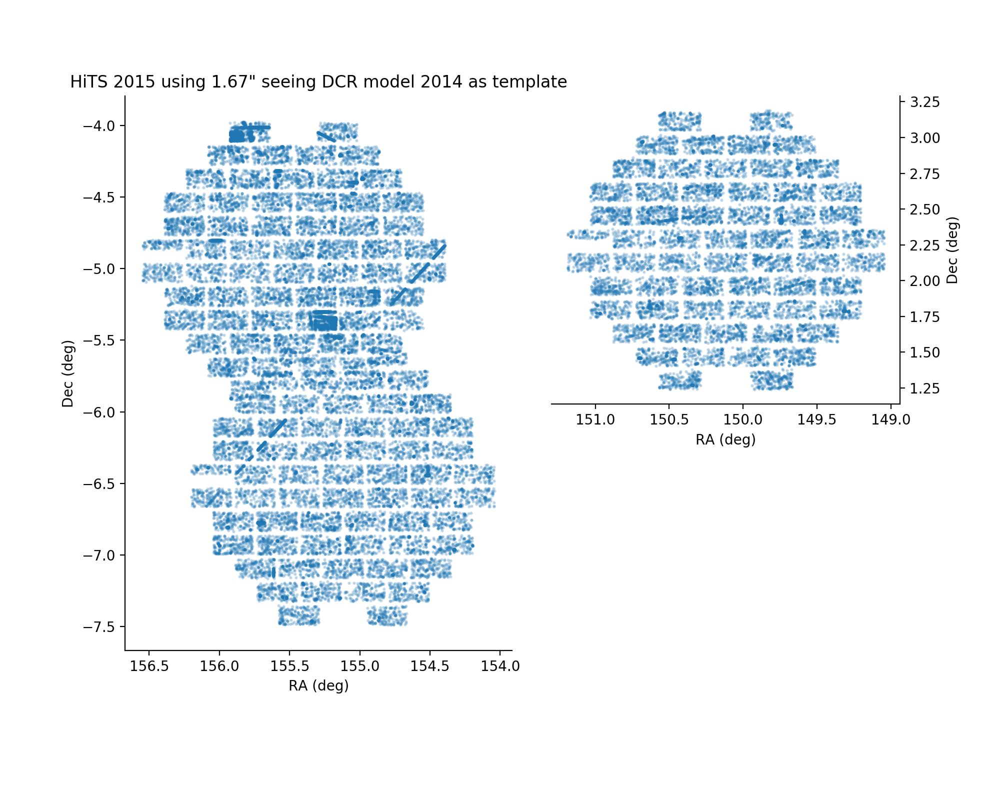

In [43]:
fig1 = plotHitsSourcesOnSky(goodObjDcr15b, title="HiTS 2015 using 1.67\" seeing DCR model 2014 as template")

### The DCR template is cleaner than compareWarp in the handful of bad CCDs even without the good seeing selection, but those CCDs are further improved with the good seeing selection.

With the good seeing selection, the distribution of un-flagged objects looks the same between the compareWarp and DCR templates.

### Visualize the good DIA objects in the 2014 science images, using 2015 CW templates

<IPython.core.display.Javascript object>


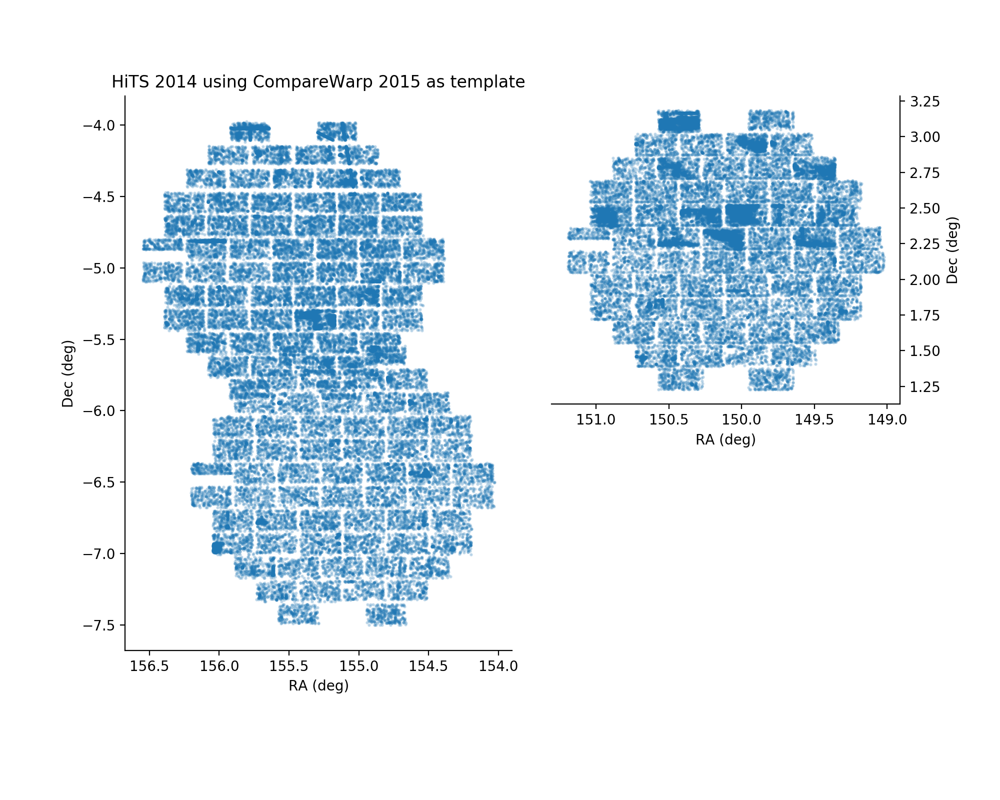

In [44]:
fig1 = plotHitsSourcesOnSky(goodObjCw14, title="HiTS 2014 using CompareWarp 2015 as template")

<IPython.core.display.Javascript object>


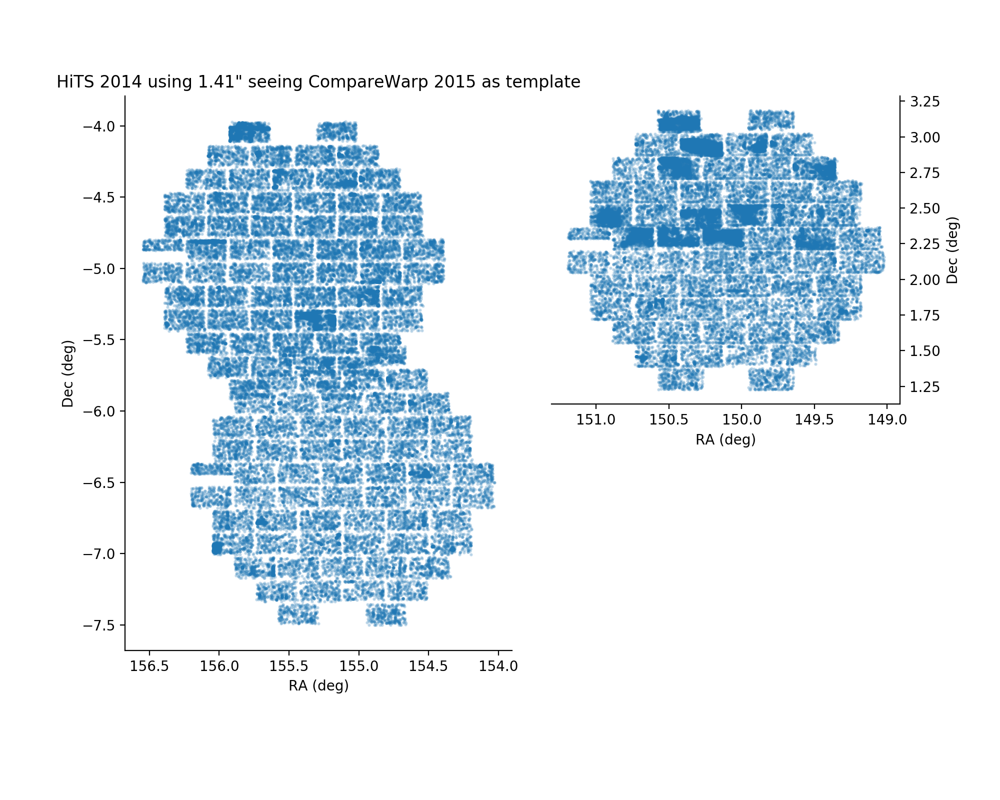

In [45]:
fig1 = plotHitsSourcesOnSky(goodObjCw14b, title="HiTS 2014 using 1.41\" seeing CompareWarp 2015 as template")

### Visualize the good DIA objects in the 2014 science images, using 2015 DCR templates

<IPython.core.display.Javascript object>


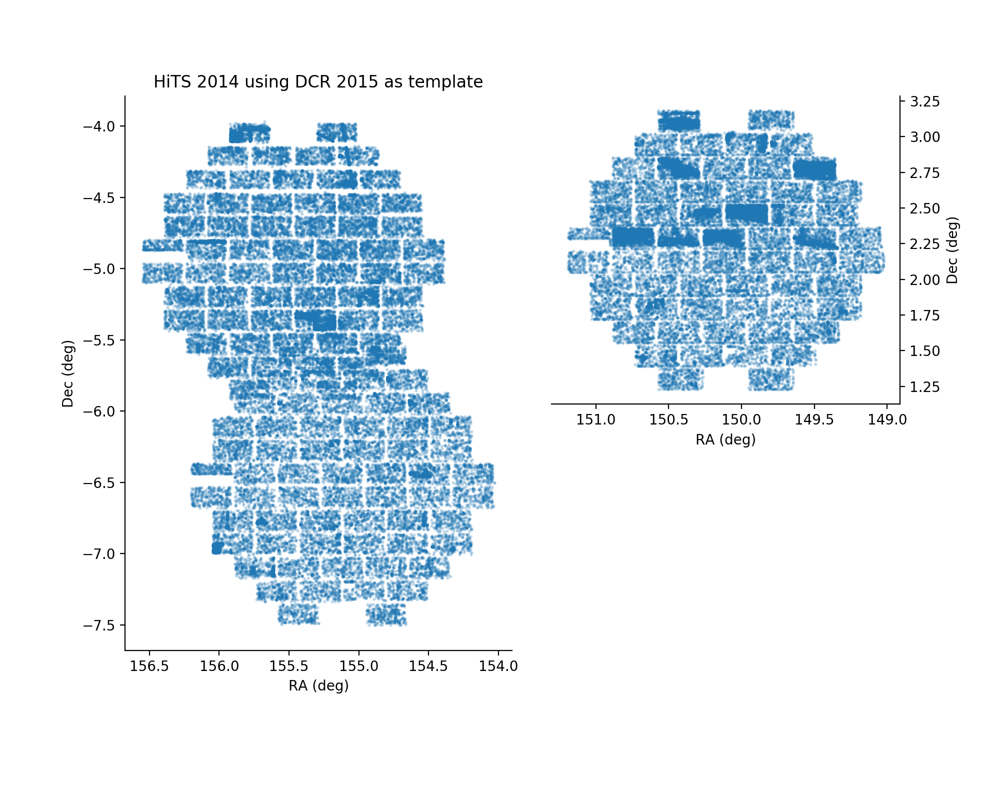

In [46]:
fig1 = plotHitsSourcesOnSky(goodObjDcr14, title="HiTS 2014 using DCR 2015 as template")

<IPython.core.display.Javascript object>


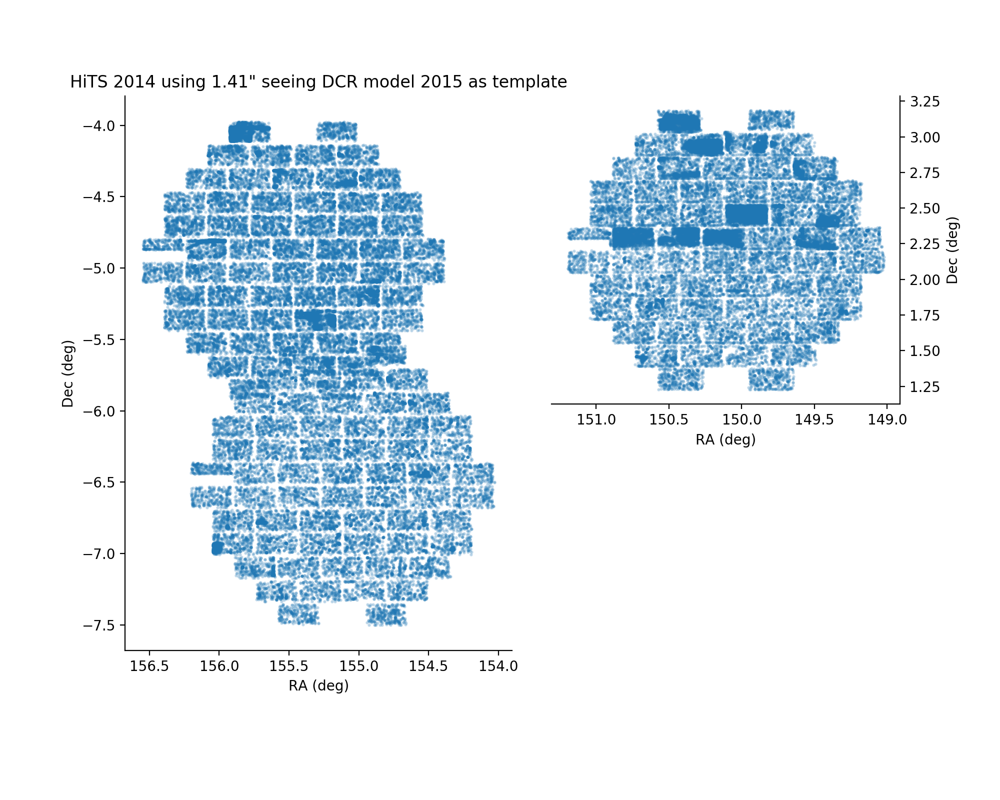

In [47]:
fig1 = plotHitsSourcesOnSky(goodObjDcr14b, title="HiTS 2014 using 1.41\" seeing DCR model 2015 as template")

### There appear to be an excess of sources throughout the field when using ANY of the 2015 templates. 

There are slight differences in a few CCDs with substantial excesses, but otherwise it looks like the detection threshold might simply be too low. We have seen separate evidence that the variance plane might be incorrect, and that could lead to a low detection threshold.

## Now look at a smaller zoomed-in region

In [48]:
def plotZoomedRegion(objTable, srcTable, title=''):
    fig = plt.figure(figsize=(9,6))
    plt.scatter(srcTable['ra'], 
                srcTable['decl'], 
                color='C1', s=5, alpha=0.3)
    plt.scatter(objTable.loc[(objTable['nDiaSources'] >= 20), 'ra'], 
                objTable.loc[(objTable['nDiaSources'] >= 20), 'decl'], 
                color='C0', s=15, alpha=0.3)
    plt.xlabel('RA (deg)')
    plt.ylabel('Dec (deg)')
    plt.gca().set_xlim(155.3, 154.8)
    plt.gca().set_ylim(-6.02, -5.60)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.title(title)

<IPython.core.display.Javascript object>


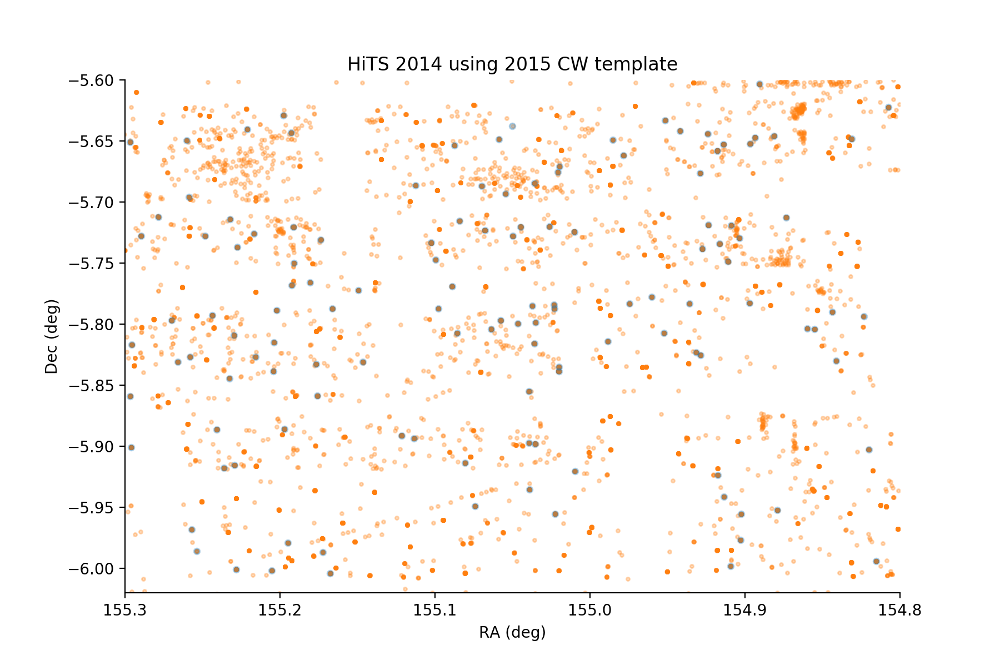

In [49]:
plotZoomedRegion(goodObjCw14, goodSrcCw14, title='HiTS 2014 using 2015 CW template')
# plotZoomedRegion(goodObjCw14b, goodSrcCw14b, title='HiTS 2014 using good seeing 2015 CW template')
# plotZoomedRegion(goodObjDcr14, goodSrcDcr14, title='HiTS 2014 using 2015 DCR template')
# plotZoomedRegion(goodObjDcr14b, goodSrcDcr14b, title='HiTS 2014 using good seeing 2015 DCR template')

### The source distribution looks the same by eye for each run using 2015 data as a template for 2014, so I only plot one representative image

<IPython.core.display.Javascript object>


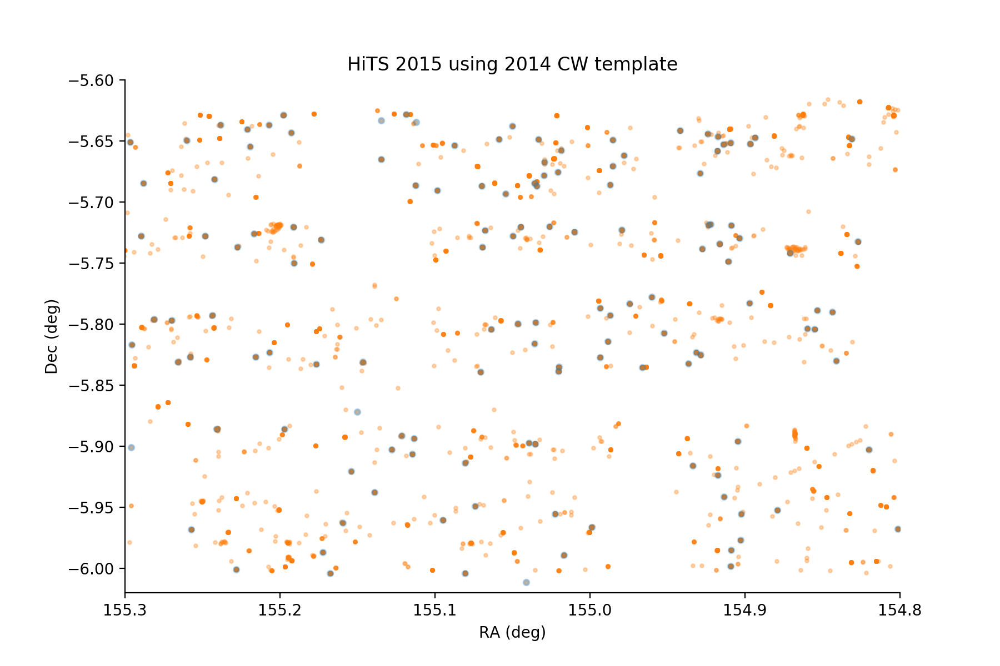

In [50]:
plotZoomedRegion(goodObjCw15, goodSrcCw15, title='HiTS 2015 using 2014 CW template')
# plotZoomedRegion(goodObjCw15b, goodSrcCw15b, title='HiTS 2015 using good seeing 2014 CW template')
# plotZoomedRegion(goodObjDcr15, goodSrcDcr15, title='HiTS 2015 using 2014 DCR template')
# plotZoomedRegion(goodObjDcr15b, goodSrcDcr15b, title='HiTS 2015 using good seeing 2014 DCR template')

### The source distribution looks the same by eye for each run using 2015 data as a template for 2014, so I only plot one representative image

### The distribution of sources looks very similar between the CW and DCR templates.
### There are more sources in the 2014 science images, however, and the excess sources look correlated.

### Now plot the histograms of just the good (not flagged) objects in each run

<IPython.core.display.Javascript object>


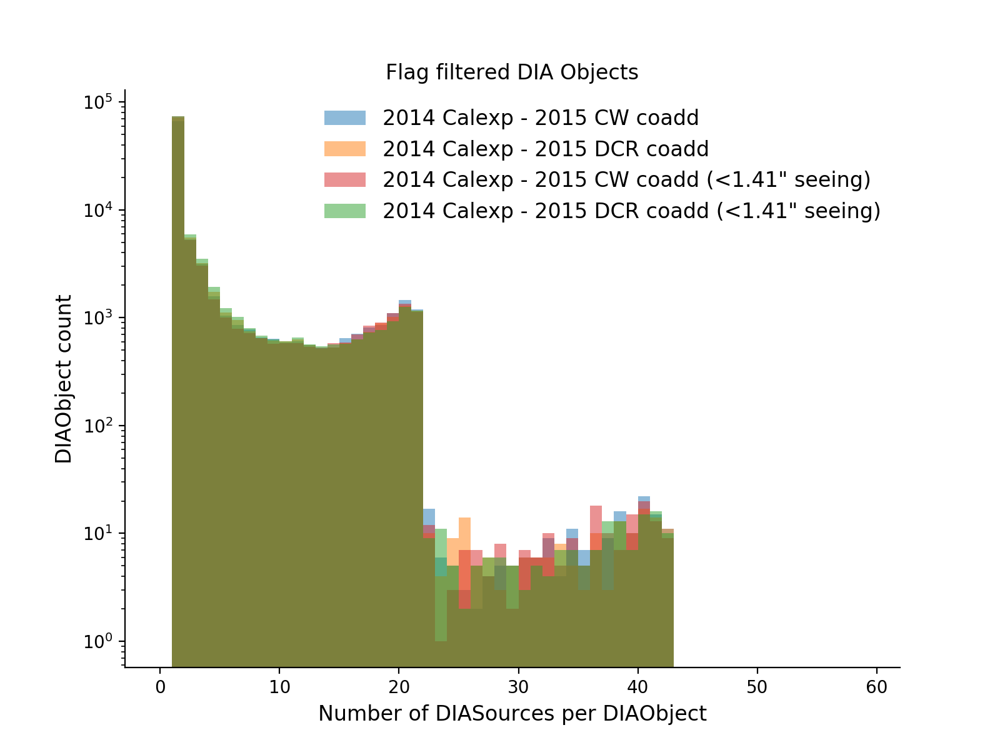

Text(0.5, 1.0, 'Flag filtered DIA Objects')

In [51]:
plt.figure(figsize=(8, 6))
plt.xlabel('Number of DIASources per DIAObject', size=12)
plt.ylabel('DIAObject count', size=12)
plt.yscale('log')
plt.hist(goodObjCw14['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C0', alpha=0.5, label='2014 Calexp - 2015 CW coadd')
plt.hist(goodObjDcr14['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C1', alpha=0.5, label='2014 Calexp - 2015 DCR coadd')

plt.hist(goodObjCw14b['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C3', alpha=0.5, label='2014 Calexp - 2015 CW coadd (<1.41" seeing)')
plt.hist(goodObjDcr14b['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C2', alpha=0.5, label='2014 Calexp - 2015 DCR coadd (<1.41" seeing)')
plt.legend(frameon=False, fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title('Flag filtered DIA Objects')

<IPython.core.display.Javascript object>


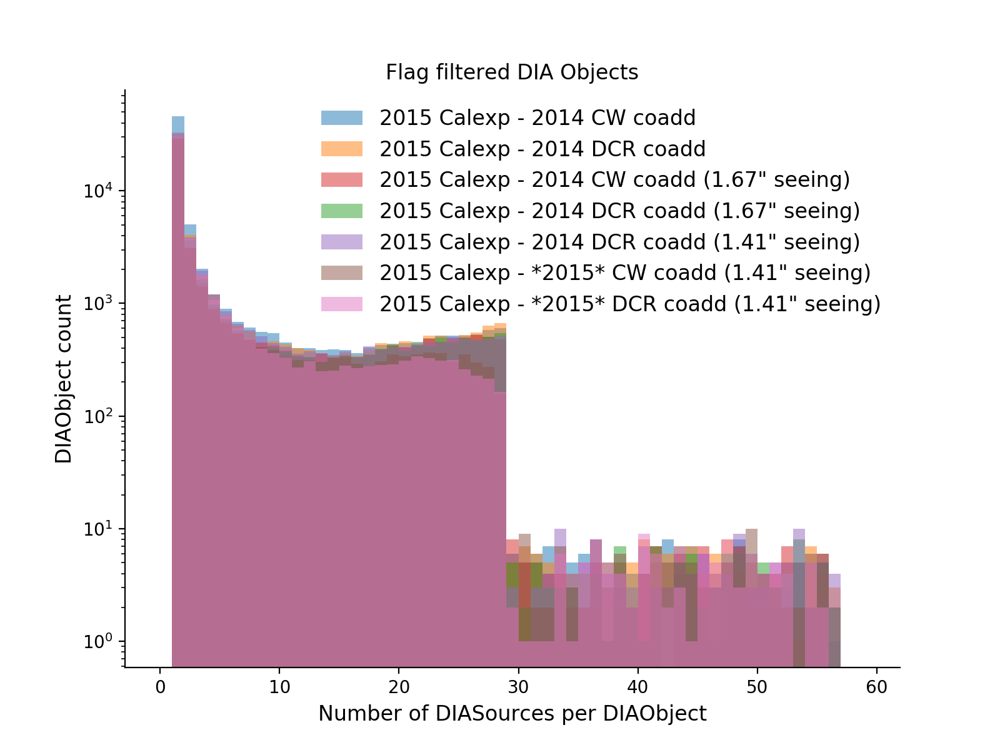

Text(0.5, 1.0, 'Flag filtered DIA Objects')

In [52]:
plt.figure(figsize=(8, 6))
plt.xlabel('Number of DIASources per DIAObject', size=12)
plt.ylabel('DIAObject count', size=12)
plt.yscale('log')
plt.hist(goodObjCw15['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C0', alpha=0.5, label='2015 Calexp - 2014 CW coadd')
plt.hist(goodObjDcr15['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C1', alpha=0.5, label='2015 Calexp - 2014 DCR coadd')

plt.hist(goodObjCw15b['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C3', alpha=0.5, label='2015 Calexp - 2014 CW coadd (1.67" seeing)')
plt.hist(goodObjDcr15b['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C2', alpha=0.5, label='2015 Calexp - 2014 DCR coadd (1.67" seeing)')

plt.hist(goodObjDcr15c['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C4', alpha=0.5, label='2015 Calexp - 2014 DCR coadd (1.41" seeing)')
plt.hist(goodObjCw15_self['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C5', alpha=0.5, label='2015 Calexp - *2015* CW coadd (1.41" seeing)')
plt.hist(goodObjDcr15_self['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C6', alpha=0.5, label='2015 Calexp - *2015* DCR coadd (1.41" seeing)')
plt.legend(frameon=False, fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title('Flag filtered DIA Objects')

## Raw DIASource Counts

In [53]:
allTable = astropy.table.Table([["All", "Good seeing"],
                                [len(srcTableCw14), len(srcTableCw14b)],
                                [len(srcTableDcr14), len(srcTableDcr14b)],
                                [len(srcTableCw15), len(srcTableCw15b)],
                                [len(srcTableDcr15), len(srcTableDcr15b)]],
                                names=["Seeing", "CW 2014", "DCR 2014", "CW 2015", "DCR 2015"])
goodTable = astropy.table.Table([["All", "Good seeing"],
                                 [len(goodSrcCw14), len(goodSrcCw14b)],
                                 [len(goodSrcDcr14), len(goodSrcDcr14b)],
                                 [len(goodSrcCw15), len(goodSrcCw15b)],
                                 [len(goodSrcDcr15), len(goodSrcDcr15b)]],
                                 names=["Seeing", "CW 2014", "DCR 2014", "CW 2015", "DCR 2015"])

In [54]:
# Total number of DIASources in each rerun
print(allTable)

   Seeing   CW 2014 DCR 2014 CW 2015 DCR 2015
----------- ------- -------- ------- --------
        All  562016   585861  528582   500311
Good seeing  555324   576868  444545   451155


In [55]:
# Total number of flag-filtered DIASources in each rerun
print(goodTable)

   Seeing   CW 2014 DCR 2014 CW 2015 DCR 2015
----------- ------- -------- ------- --------
        All  256906   256900  252148   233889
Good seeing  257526   259451  209799   211766


### These results are mixed.
On the one hand, the 2014 DCR template seems to improve the results when there is no seeing cut, but on the other hand making the seeing cut improves the results even more. However, with the seeing cut the DCR template is actually worse than using compareWarp.

My conclusion is that the observations with the worst seeing also tend to be at higher airmass, so removing them reduces the constraints on the DCR model and reduces the DCR contamination of the compareWarp template.

However, the plots of the source detections (above) show that a few CCDs 

## Evaluate the DCR metric for each run

The DCR metric is an assessment of how well the observing conditions (parallactic angle and airmass) are able to constrain the DCR model. And, subsequently, how well the DCR model is able to fit a science image and construct a well-matched template. Additional information on the metric can be found in DM-18416 and the related notebook in this repository, `DM-18416-DCR-metric-development.ipynb`

The metric is normalized such that an overall value of 1.0 or greater is considered well-constrained, and a particular science image can be matched if the metric evaluates to 1.0 or greater for its' observing conditions.

Note that the DCR metric does not take into account variable seeing of the input observations, though that has a significant impact on the ability of the DCR algorithm to fit a good solution. This was investigated in DMTN-121: Impact of variable seeing on DCR coadd generation (`https://dmtn-121.lsst.io`), with the conclusion that the DCR model was well fit as long as the worst seeing of the inputs was no more than 50% greater than the best seeing.

Below, note that the year number in the names of the butlers corresponds to the year of the *science* images, so the coadd will be from the other year

In [56]:
dcrCoadd14_all = butlerDcr15.get('dcrCoadd', dataId={'tract':0,'patch':patch,'filter':'g', 'subfilter':1, 'numSubfilters':3})
dcrCoadd14_goodSeeing = butlerDcr15b.get('dcrCoadd', dataId={'tract':0,'patch':patch,'filter':'g', 'subfilter':1, 'numSubfilters':3})
dcrCoadd14_betterSeeing = butlerDcr15c.get('dcrCoadd', dataId={'tract':0,'patch':patch,'filter':'g', 'subfilter':1, 'numSubfilters':3})

In [57]:
dcrCoadd15_all = butlerDcr14.get('dcrCoadd', dataId={'tract':0,'patch':patch,'filter':'g', 'subfilter':1, 'numSubfilters':3})
dcrCoadd15_goodSeeing = butlerDcr14b.get('dcrCoadd', dataId={'tract':0,'patch':patch,'filter':'g', 'subfilter':1, 'numSubfilters':3})

In [58]:
coaddInputs14_all = dcrCoadd14_all.getInfo().getCoaddInputs()
coaddInputs14_goodSeeing = dcrCoadd14_goodSeeing.getInfo().getCoaddInputs()
coaddInputs14_betterSeeing = dcrCoadd14_betterSeeing.getInfo().getCoaddInputs()

In [59]:
coaddInputs15_all = dcrCoadd15_all.getInfo().getCoaddInputs()
coaddInputs15_goodSeeing = dcrCoadd15_goodSeeing.getInfo().getCoaddInputs()

In [60]:
visits14_all = set(coaddInputs14_all.ccds['id'] // 100)
visits14_goodSeeing = set(coaddInputs14_goodSeeing.ccds['id'] // 100)
visits14_betterSeeing = set(coaddInputs14_betterSeeing.ccds['id'] // 100)

In [61]:
print(len(visits14_all), len(visits14_goodSeeing), len(visits14_betterSeeing))

21 18 11


In [62]:
visits15_all = set(coaddInputs15_all.ccds['id'] // 100)
visits15_goodSeeing = set(coaddInputs15_goodSeeing.ccds['id'] // 100)

In [63]:
print(len(visits15_all), len(visits15_goodSeeing))

28 20


Pick a single CCD

In [64]:
ccd = 42

Remember, the butler year number is for the science images, and will not be the same as the year of the template

In [65]:
visitInfos14 = {visit:butlerDcr15.get("calexp_visitInfo", dataId={'filter':'g', 'ccdnum':ccd, 'visit':visit}) for visit in visits14_all}

In [66]:
visitInfos15 = {visit:butlerDcr14.get("calexp_visitInfo", dataId={'filter':'g', 'ccdnum':ccd, 'visit':visit}) for visit in visits15_all}

## What does the metric tell us about the fit of the 2014 model for the 2015 science images?

<IPython.core.display.Javascript object>


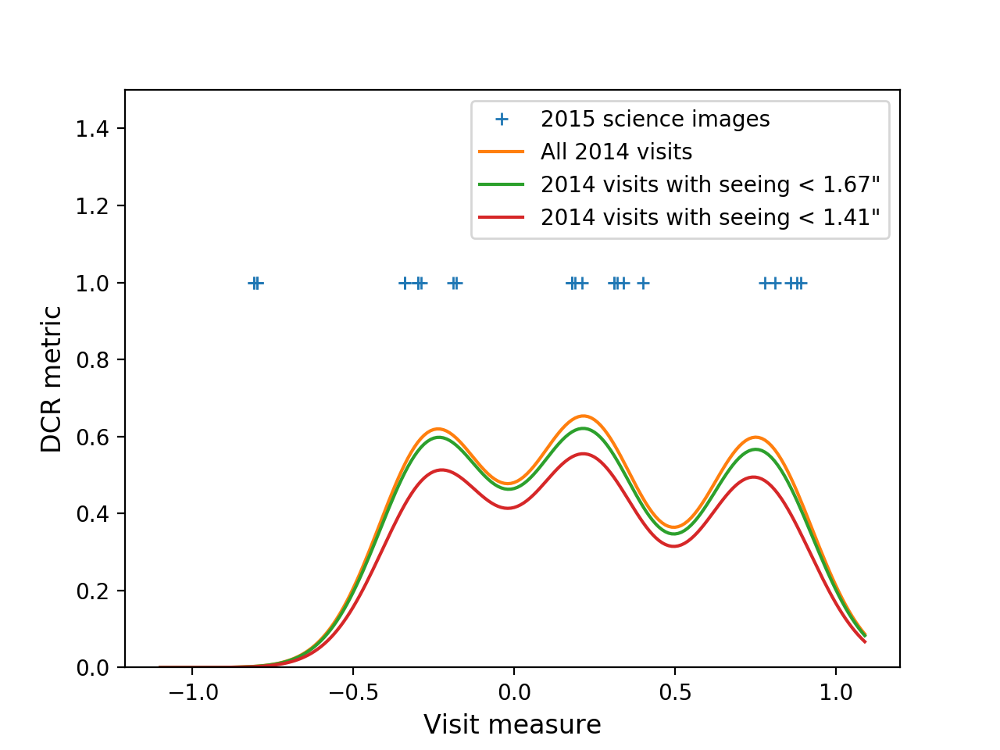

Metric (no seeing cut): 0.4273382284763841
Metric (seeing < 1.67"): 0.40866028245412095
Metric (seeing < 1.41"): 0.3584104109584583


In [89]:
figureId14 = 101
dcrMetric14_all = DcrMetric()
for visit in visits14_all:
    dcrMetric14_all.addVisitInfo(visitInfos14[visit])
dcrMetric14_goodSeeing = DcrMetric()
for visit in visits14_goodSeeing:
    dcrMetric14_goodSeeing.addVisitInfo(visitInfos14[visit])
dcrMetric14_betterSeeing = DcrMetric()
for visit in visits14_betterSeeing:
    dcrMetric14_betterSeeing.addVisitInfo(visitInfos14[visit])
alerts_2015 = [dcrMetric14_all.parameterizeVisit(visitInfos15[visit].getBoresightAirmass(), visitInfos15[visit].getBoresightHourAngle().asRadians()) for visit in visits15_all]
plt.figure(figureId14)
plt.plot(alerts_2015, np.ones(len(visits15_all)),'+')
plt.ylabel("DCR metric")
plt.ylim([0,1.5])
    
dcrMetric14_all.plotMetric(window=figureId14, plot_input_observations=False)
dcrMetric14_goodSeeing.plotMetric(window=figureId14, plot_input_observations=False)
dcrMetric14_betterSeeing.plotMetric(window=figureId14, plot_input_observations=False)
plt.legend(['2015 science images', 'All 2014 visits', '2014 visits with seeing < 1.67"', '2014 visits with seeing < 1.41"'])
print(f'Metric (no seeing cut): {dcrMetric14_all.metric}')
print(f'Metric (seeing < 1.67"): {dcrMetric14_goodSeeing.metric}')
print(f'Metric (seeing < 1.41"): {dcrMetric14_betterSeeing.metric}')

### What can we take from this?

The HiTS 2014 survey poorly constrained the DCR model, since the metric is significantly less than 1.0 everywhere. However, the metric is relatively flat and does not degrade too much with the good seeing cuts. Also, the 2015 science images are equally well fit by the model, or or equally poorly fit, depending on your perspective.

The 2014 model used on 2015 science images saw a slight improvement overall compared to the CompareWarp templates. Given the low metric, it is not surprising that the improvement was not better.

## What does the metric tell us about the fit of the 2015 model for the 2014 science images?

<IPython.core.display.Javascript object>


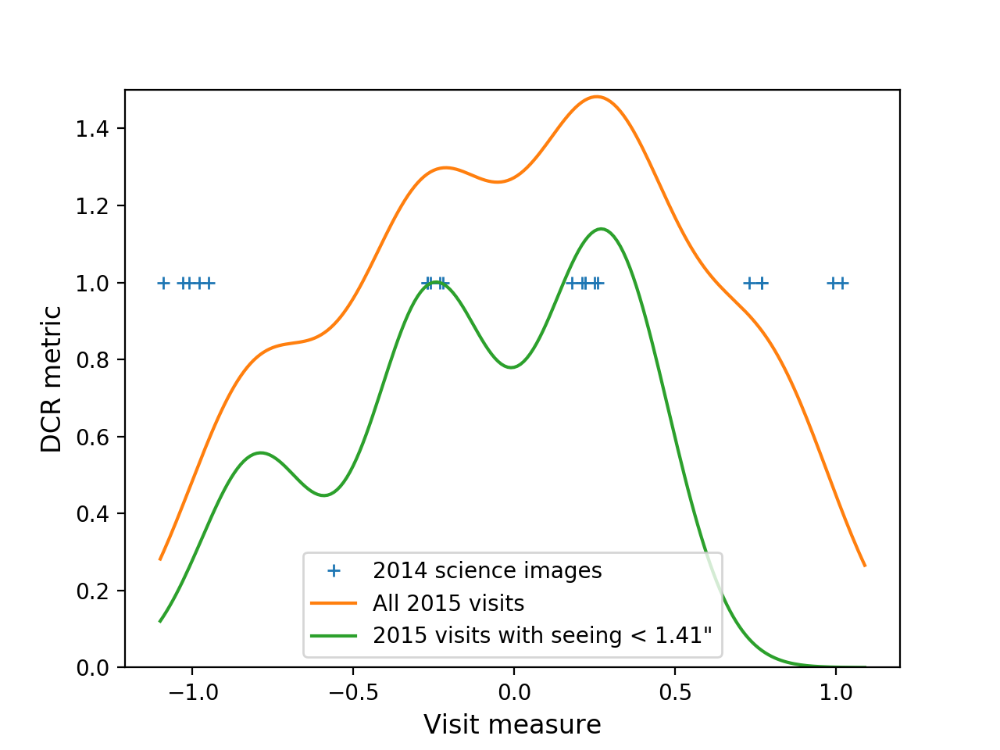

Metric (no seeing cut): 1.1561119231679955
Metric (seeing < 1.41"): 0.6968181508289042


In [90]:
figureId15 = 102
dcrMetric15_all = DcrMetric()
for visit in visits15_all:
    dcrMetric15_all.addVisitInfo(visitInfos15[visit])
dcrMetric15_goodSeeing = DcrMetric()
for visit in visits15_goodSeeing:
    dcrMetric15_goodSeeing.addVisitInfo(visitInfos15[visit])
alerts_2014 = [dcrMetric15_all.parameterizeVisit(visitInfos14[visit].getBoresightAirmass(), visitInfos14[visit].getBoresightHourAngle().asRadians()) for visit in visits14_all]
plt.figure(figureId15)
plt.plot(alerts_2014, np.ones(len(visits14_all)),'+')
plt.xlabel("Visit measure [airmass*sign(parallactic_angle)]")
plt.ylabel("DCR metric")
plt.ylim([0,1.5])

dcrMetric15_all.plotMetric(window=figureId15, plot_input_observations=False)
dcrMetric15_goodSeeing.plotMetric(window=figureId15, plot_input_observations=False)
plt.legend(['2014 science images', 'All 2015 visits', '2015 visits with seeing < 1.41"'])
print(f'Metric (no seeing cut): {dcrMetric15_all.metric}')
print(f'Metric (seeing < 1.41"): {dcrMetric15_goodSeeing.metric}')

### What can we take from this?

The 2015 model initially looks well constrained, but becomes poorly constrained once we make a good seeing cut. This suggests that the seeing is significantly more variable in the 2015 data than it was in 2014, which likely explains the poor performance even though the metric looks OK. I'll explore the seeing in the next section.

Once we take the good seeing cut, however, all of the high airmass observations appear to be cut. This forces the model to extrapolate when trying to fit many of the 2014 science observations, and we can see that the matching metric is almost zero for those high airmass observations.

This suggests that we should only use the 2014 science images with airmass less than 1.5 (corresponding to a visit measure between -0.5 and 0.5).

## Compare the ranges of seeing in the input observations

In [69]:
sigma2fwhm = 2.*np.sqrt(2.*np.log(2.))

In [70]:
psf14_sizes = {visit:butlerDcr15.get("calexp", dataId={'filter':'g', 'ccdnum':ccd, 'visit':visit}).getPsf().computeShape().getDeterminantRadius()*sigma2fwhm for visit in visits14_all}

In [71]:
psf15_sizes = {visit:butlerDcr14.get("calexp", dataId={'filter':'g', 'ccdnum':ccd, 'visit':visit}).getPsf().computeShape().getDeterminantRadius()*sigma2fwhm for visit in visits15_all}

In [72]:
decam_platescale = 0.26

In [73]:
psf14_all = [psf14_sizes[visit]*decam_platescale for visit in visits14_all]
psf14_goodSeeing = [psf14_sizes[visit]*decam_platescale for visit in visits14_goodSeeing]
psf14_betterSeeing = [psf14_sizes[visit]*decam_platescale for visit in visits14_betterSeeing]

In [74]:
psf15_all = [psf15_sizes[visit]*decam_platescale for visit in visits15_all]
psf15_goodSeeing = [psf15_sizes[visit]*decam_platescale for visit in visits15_goodSeeing]

In [75]:
psf14_table = astropy.table.Table([["Min seeing", "Max seeing", "Ratio"],
                                   [np.min(psf14_all), np.max(psf14_all), np.max(psf14_all)/np.min(psf14_all)],
                                   [np.min(psf14_goodSeeing), np.max(psf14_goodSeeing), np.max(psf14_goodSeeing)/np.min(psf14_goodSeeing)],
                                   [np.min(psf14_betterSeeing), np.max(psf14_betterSeeing), np.max(psf14_betterSeeing)/np.min(psf14_betterSeeing)]],
                                  names=["2014 coadd", "No seeing cut", "Seeing < 1.67\"", "Seeing < 1.41\""])

In [76]:
psf14_table

2014 coadd,No seeing cut,"Seeing < 1.67""","Seeing < 1.41"""
str10,float64,float64,float64
Min seeing,0.9956666814932892,0.9956666814932892,0.9956666814932892
Max seeing,1.9791473941706845,1.6402523590652314,1.3164856164005552
Ratio,1.9877609956801834,1.6473910290994171,1.322215195979146


In [77]:
psf15_table = astropy.table.Table([["Min seeing", "Max seeing", "Ratio"],
                                   [np.min(psf15_all), np.max(psf15_all), np.max(psf15_all)/np.min(psf15_all)],
                                   [np.min(psf15_goodSeeing), np.max(psf15_goodSeeing), np.max(psf15_goodSeeing)/np.min(psf15_goodSeeing)]],
                                  names=["2015 coadd", "No seeing cut", "Seeing < 1.41\""])

In [78]:
psf15_table

2015 coadd,No seeing cut,"Seeing < 1.41"""
str10,float64,float64
Min seeing,0.7816272832937017,0.7816272832937017
Max seeing,2.7690272318686087,1.292167292970028
Ratio,3.542644033867646,1.6531757790298214


### Note that the best seeing is lower and the worst seeing is higher in 2015 than in 2014

The 2014 data may have slightly worse seeing on average, but it is also more consistent. That makes it a better fit for the current DCR algorithm. However, the 2014 data lacks a wide distribution of airmasses, and so is unable to fully constrain the DCR algorithm.

The 2015 data may have a sufficiently wide range of airmasses, but the seeing distribution is all over the place. Additionally, it is the high airmass observations that have the worst seeing, and once they are cut the model loses its best constraints.

# Conclusions



Sadly, the 2014 and 2015 HiTS datasets may not be sufficient to test the DCR modeling algorithm. The 2014 data have an insufficient range of airmasses to fully constrain the model, achieving a metric of only 0.427 when 1.0 is required. The 2015 data look more promising with an initial metric of 1.15, but the high airmass observations have terrible seeing.

Since we have extensive experience with HiTS I intend to make one more attempt. In this final attempt I will again use 2015 data, but will balance the needs of constraining the DCR model with the requirement that the variations in seeing be minimized. To do this, I will need to evaluate the DCR metric for each reasonable set of observations, and determine the set of visits to be used ahead of time, rather than using a simple good seeing selection.

I also suggest excluding the extremely high airmass observations from future ap_pipe runs. The observations with airmass greater than 2, and possibly those with airmass greater than 1.5, are outside the normal range we expect for LSST. These observations can't be matched with a standard CompareWarp template, and would require a carefully designed set of observations to match with a DCR template. The very large number of false positives coming from these very high airmass observations are likely contaminating our results.